# Data Collection from Google Earth Engine
Initial code provided by the Google Earth Engine for Python [startup guide](https://developers.google.com/earth-engine/guides/quickstart_python?authuser=1)

In [2]:
#@title Copyright 2024 The Earth Engine Community Authors { display-mode: "form" }
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

## Notebook setup

**1.** Import the Earth Engine and geemap libraries.

In [1]:
import ee
import geemap.core as geemap

**2.** Authenticate and initialize the Earth Engine service. Follow the
resulting prompts to complete authentication. Be sure to replace PROJECT_ID
with the name of the project you set up for this quickstart.

In [2]:
ee.Authenticate()
ee.Initialize(project='clever-hangar-474416-n6')

## Retrieve raster data and state geometry

**1.** Load climate data (independent variables) for a given period and display its metadata.

In [3]:
jan_2023_climate = (
    ee.ImageCollection('ECMWF/ERA5_LAND/MONTHLY_AGGR')
    .filterDate('2023-01', '2023-02')
    .first()
)
jan_2023_climate

**2.** Load degree urbanization variable (dependent variable) and display metadata

In [4]:
deg_urbanization = (
    ee.Image("JRC/GHSL/P2023A/GHS_SMOD_V2-0/2025")
    #.filterMetadata('system:index', 'equals', 'JRC/GHSL/P2023A/GHS_SMOD_V2-0/2025')

)
deg_urbanization

**3.** Load state geometry

In [29]:
state_abbreviation = 'MD'
states = ee.FeatureCollection('TIGER/2018/States')
single_state_feature = states.filter(
    ee.Filter.eq('STUSPS', state_abbreviation)
).first()
state_geometry = single_state_feature.geometry()


## Clip images

**1.** Clip climate data



In [30]:
clipped_climate = jan_2023_climate.clip(state_geometry)

clipped_climate

**2.** Clip urbanization

In [31]:
clipped_urbanization = deg_urbanization.clip(state_geometry)
clipped_urbanization

## Randomly sample points within state

In [45]:
random_points = ee.FeatureCollection.randomPoints(
    region=state_geometry,
    points=1000,
    seed=42
)

## Extract and chart data

**1.** Import the Altair charting library.

In [33]:
%pip install -q --upgrade altair
import altair as alt

**2.** Extract the climate data for the random points as a pandas DataFrame.

In [46]:
points_climate = jan_2023_climate.reduceRegions(random_points, ee.Reducer.first())

points_climate_df = ee.data.computeFeatures(
    {'expression': points_climate, 'fileFormat': 'PANDAS_DATAFRAME'}
)
points_climate_df['longitude'] = points_climate_df['geo'].apply(lambda x: x['coordinates'][0])
points_climate_df['latitude'] = points_climate_df['geo'].apply(lambda x: x['coordinates'][1])

points_climate_df

,geo,dewpoint_temperature_2m,dewpoint_temperature_2m_max,dewpoint_temperature_2m_min,evaporation_from_bare_soil_max,evaporation_from_bare_soil_min,evaporation_from_bare_soil_sum,evaporation_from_open_water_surfaces_excluding_oceans_max,evaporation_from_open_water_surfaces_excluding_oceans_min,evaporation_from_open_water_surfaces_excluding_oceans_sum,...,volumetric_soil_water_layer_2_max,volumetric_soil_water_layer_2_min,volumetric_soil_water_layer_3,volumetric_soil_water_layer_3_max,volumetric_soil_water_layer_3_min,volumetric_soil_water_layer_4,volumetric_soil_water_layer_4_max,volumetric_soil_water_layer_4_min,longitude,latitude
0,"{'type': 'Point', 'coordinates': [-75.79518174...",274.906131,288.500839,263.576294,2.328306e-10,-0.000093,-0.009740,0.000032,-0.000030,-0.003725,...,0.429977,0.389816,0.406867,0.416870,0.400635,0.404048,0.407013,0.402466,-75.795182,39.300566
1,"{'type': 'Point', 'coordinates': [-78.47430391...",272.382778,286.654373,262.385254,2.328306e-10,-0.000115,-0.008486,0.000031,-0.000122,-0.002999,...,0.415329,0.370636,0.373315,0.386124,0.352707,0.328772,0.335403,0.323929,-78.474304,39.686321
2,"{'type': 'Point', 'coordinates': [-76.20472043...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-76.204720,39.317440
3,"{'type': 'Point', 'coordinates': [-75.87097791...",275.022471,288.910995,263.472778,4.656613e-10,-0.000085,-0.008492,0.000028,-0.000075,-0.004113,...,0.430069,0.390335,0.407796,0.419098,0.401062,0.405857,0.408859,0.404633,-75.870978,39.140173
4,"{'type': 'Point', 'coordinates': [-75.98701601...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-75.987016,38.186983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,"{'type': 'Point', 'coordinates': [-76.19633265...",274.596469,287.004745,262.896606,2.328306e-10,-0.000103,-0.010739,0.000021,-0.000086,-0.004194,...,0.520004,0.456635,0.491815,0.508194,0.484238,0.487744,0.492981,0.485565,-76.196333,39.498476
996,"{'type': 'Point', 'coordinates': [-75.85596643...",276.654856,288.046051,266.556152,2.328306e-10,-0.000128,-0.013394,0.000023,-0.000120,-0.017878,...,0.438995,0.355026,0.362088,0.385239,0.350708,0.310688,0.316208,0.307159,-75.855966,38.044786
997,"{'type': 'Point', 'coordinates': [-77.55824511...",273.223648,287.417984,263.404556,1.164153e-10,-0.000116,-0.010253,0.000051,-0.000112,-0.003703,...,0.520004,0.465317,0.492535,0.506607,0.484955,0.469747,0.481293,0.459976,-77.558245,39.497958
998,"{'type': 'Point', 'coordinates': [-76.93665219...",274.300500,288.636307,262.115356,2.328306e-10,-0.000170,-0.017142,0.000040,-0.000118,-0.004333,...,0.520004,0.459763,0.489228,0.505722,0.479858,0.473603,0.482010,0.468460,-76.936652,39.135629


In [47]:
nan_count = points_climate_df['dewpoint_temperature_2m'].isna().sum()
print(f"Number of NaN values in 'dewpoint_temperature_2m': {nan_count}")

Number of NaN values in 'dewpoint_temperature_2m': 189


**3.** Extract the data for the random points from the urbanization data

In [49]:
points_urbanization = clipped_urbanization.reduceRegions(random_points, ee.Reducer.first())

points_urbanization_df = ee.data.computeFeatures(
    {'expression': points_urbanization, 'fileFormat': 'PANDAS_DATAFRAME'}
)

points_urbanization_df['longitude'] = points_urbanization_df['geo'].apply(lambda x: x['coordinates'][0])
points_urbanization_df['latitude'] = points_urbanization_df['geo'].apply(lambda x: x['coordinates'][1])

In [53]:
# Round the coordinates to 6 decimal places for a robust join
points_climate_df['lon_rounded'] = points_climate_df['longitude'].round(6)
points_climate_df['lat_rounded'] = points_climate_df['latitude'].round(6)

points_urbanization_df['lon_rounded'] = points_urbanization_df['longitude'].round(6)
points_urbanization_df['lat_rounded'] = points_urbanization_df['latitude'].round(6)

# Perform the merge on the rounded columns
merged_df = pd.merge(
    points_climate_df,
    points_urbanization_df,
    left_on=['lon_rounded', 'lat_rounded'],
    right_on=['lon_rounded', 'lat_rounded'],
    how='inner' # Use 'left' or 'inner' as needed
)

df_cleaned = merged_df.dropna(how='any')

,geo_x,dewpoint_temperature_2m,dewpoint_temperature_2m_max,dewpoint_temperature_2m_min,evaporation_from_bare_soil_max,evaporation_from_bare_soil_min,evaporation_from_bare_soil_sum,evaporation_from_open_water_surfaces_excluding_oceans_max,evaporation_from_open_water_surfaces_excluding_oceans_min,evaporation_from_open_water_surfaces_excluding_oceans_sum,...,volumetric_soil_water_layer_4_max,volumetric_soil_water_layer_4_min,longitude_x,latitude_x,lon_rounded,lat_rounded,geo_y,first,longitude_y,latitude_y
0,"{'type': 'Point', 'coordinates': [-75.79518174...",274.906131,288.500839,263.576294,2.328306e-10,-0.000093,-0.009740,0.000032,-0.000030,-0.003725,...,0.407013,0.402466,-75.795182,39.300566,-75.795182,39.300566,"{'type': 'Point', 'coordinates': [-75.79518174...",11,-75.795182,39.300566
1,"{'type': 'Point', 'coordinates': [-78.47430391...",272.382778,286.654373,262.385254,2.328306e-10,-0.000115,-0.008486,0.000031,-0.000122,-0.002999,...,0.335403,0.323929,-78.474304,39.686321,-78.474304,39.686321,"{'type': 'Point', 'coordinates': [-78.47430391...",11,-78.474304,39.686321
3,"{'type': 'Point', 'coordinates': [-75.87097791...",275.022471,288.910995,263.472778,4.656613e-10,-0.000085,-0.008492,0.000028,-0.000075,-0.004113,...,0.408859,0.404633,-75.870978,39.140173,-75.870978,39.140173,"{'type': 'Point', 'coordinates': [-75.87097791...",11,-75.870978,39.140173
5,"{'type': 'Point', 'coordinates': [-75.90248738...",274.552718,287.667984,262.908325,2.328306e-10,-0.000129,-0.013918,0.000017,-0.000042,-0.005289,...,0.368729,0.357620,-75.902487,39.647083,-75.902487,39.647083,"{'type': 'Point', 'coordinates': [-75.90248738...",11,-75.902487,39.647083
6,"{'type': 'Point', 'coordinates': [-77.19988050...",273.720109,288.200058,262.735138,2.328306e-10,-0.000110,-0.010169,0.000048,-0.000080,-0.003629,...,0.390747,0.372498,-77.199881,39.477827,-77.199881,39.477827,"{'type': 'Point', 'coordinates': [-77.19988050...",11,-77.199881,39.477827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,"{'type': 'Point', 'coordinates': [-76.19633265...",274.596469,287.004745,262.896606,2.328306e-10,-0.000103,-0.010739,0.000021,-0.000086,-0.004194,...,0.492981,0.485565,-76.196333,39.498476,-76.196333,39.498476,"{'type': 'Point', 'coordinates': [-76.19633265...",11,-76.196333,39.498476
996,"{'type': 'Point', 'coordinates': [-75.85596643...",276.654856,288.046051,266.556152,2.328306e-10,-0.000128,-0.013394,0.000023,-0.000120,-0.017878,...,0.316208,0.307159,-75.855966,38.044786,-75.855966,38.044786,"{'type': 'Point', 'coordinates': [-75.85596643...",10,-75.855966,38.044786
997,"{'type': 'Point', 'coordinates': [-77.55824511...",273.223648,287.417984,263.404556,1.164153e-10,-0.000116,-0.010253,0.000051,-0.000112,-0.003703,...,0.481293,0.459976,-77.558245,39.497958,-77.558245,39.497958,"{'type': 'Point', 'coordinates': [-77.55824511...",12,-77.558245,39.497958
998,"{'type': 'Point', 'coordinates': [-76.93665219...",274.300500,288.636307,262.115356,2.328306e-10,-0.000170,-0.017142,0.000040,-0.000118,-0.004333,...,0.482010,0.468460,-76.936652,39.135629,-76.936652,39.135629,"{'type': 'Point', 'coordinates': [-76.93665219...",12,-76.936652,39.135629


**4.** Check spread of dependant variable

In [54]:
alt.Chart(df_cleaned).mark_bar().encode(
    alt.X('first:N', title='Urbanization Degree (First Variable)'),
    alt.Y('count()', title='Number of Points')
).properties(
    title='Bar Chart of Urbanization Degree'
)

alt.Chart(...)

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [70]:
df_cleaned.to_pickle('/content/drive/MyDrive/Fall 2025/Data Analysis/lab_5_df.pkl')

# Lab 5 start

**1.** Import needed libraries

In [26]:
pip install statsmodels

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error

In [8]:
## Do this so you don't need to re-retrieve data from Earth Engine (throttling)
df_cleaned = pd.read_pickle('/content/drive/MyDrive/Fall 2025/Data Analysis/lab_5_df.pkl')

In [9]:
# all variables from the climate raster
X = df_cleaned.loc[:, 'dewpoint_temperature_2m':'volumetric_soil_water_layer_4_min']
# the degree urbanization variable
y = df_cleaned['first']

## CONSIDER MAKING Y A CATEGORICAL VARIABLE

Split testing and training data

In [10]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [57]:
ols_model = LinearRegression()
ols_model.fit(X_train, y_train)
y_pred = ols_model.predict(X_test)

print('Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

Mean Squared Error: 3.8069064325573896


In [58]:
from sklearn.metrics import mean_squared_error, r2_score
r_squared = r2_score(y_test, y_pred)
print('R-squared:', r_squared)

R-squared: 0.46587467139853567


In [59]:
coefficients = pd.Series(ols_model.coef_, index=X.columns)
coefficients

,0
dewpoint_temperature_2m,-1.700406
dewpoint_temperature_2m_max,1.569618
dewpoint_temperature_2m_min,-0.933350
evaporation_from_bare_soil_max,1.391918
evaporation_from_bare_soil_min,-7817.716039
...,...
volumetric_soil_water_layer_3_max,5.753929
volumetric_soil_water_layer_3_min,157.998667
volumetric_soil_water_layer_4,-153.018556
volumetric_soil_water_layer_4_max,597.056798


In [11]:
rf_best = RandomForestClassifier()
rf_best.fit(X_train, y_train)
y_pred = rf_best.predict(X_test)

print('Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

Mean Squared Error: 4.526787302125927


In [12]:
# Calculate and print the R-squared value using the model's score method
r_squared = rf_best.score(X_test, y_test)
print('R-squared:', r_squared)

R-squared: 0.6065573770491803


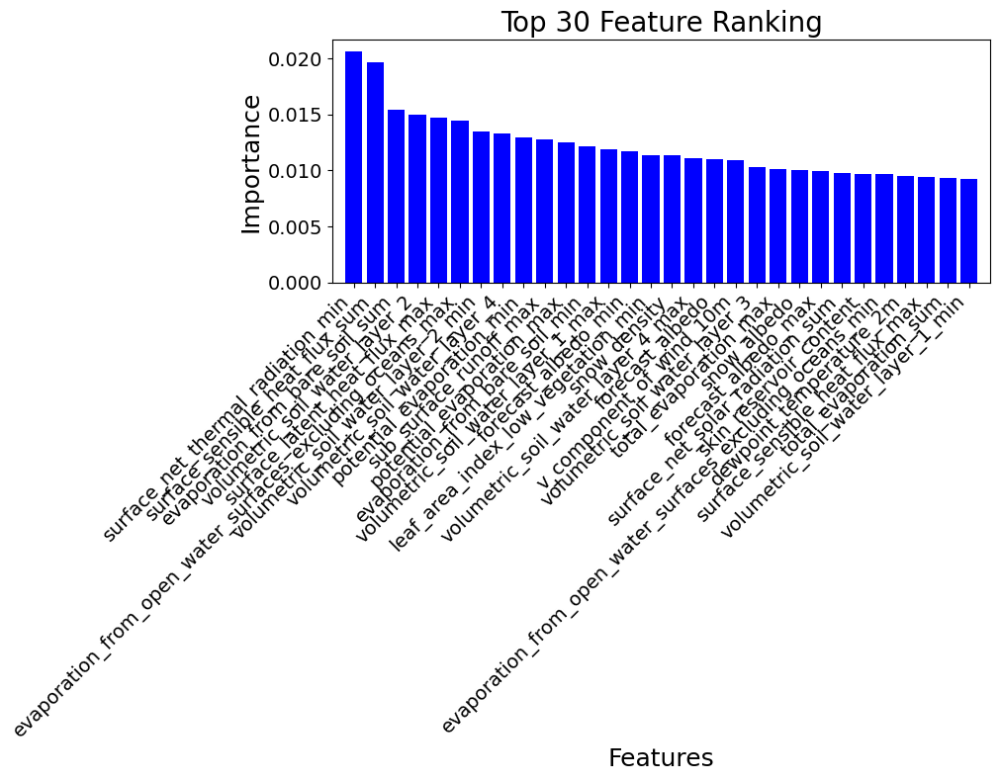

In [13]:
# For rf_best as our trained Random Forest model
# --- Set the limit for the number of features ---
TOP_N = 30

# --- Existing calculations ---
importance = rf_best.feature_importances_
indices = np.argsort(importance)[::-1]
feature_names = X.columns

# --- 1. Slice all relevant arrays to only keep the top N features ---
top_indices = indices[:TOP_N]
top_importance = importance[top_indices]
top_feature_names = feature_names[top_indices]


# --- 2. Plotting with updated slices and ranges ---
f, ax = plt.subplots(figsize=(10, 8))

# Use top_importance and range(TOP_N) for the bar plot
plt.bar(range(TOP_N), top_importance, color="b", align="center")

plt.title(f"Top {TOP_N} Feature Ranking", fontsize=20)

# Use top_feature_names and range(TOP_N) for the x-axis ticks
plt.xticks(range(TOP_N), top_feature_names, rotation=45, ha='right') # ha='right' improves alignment
plt.tick_params(labelsize=14) # Optional: make labels more readable

# Adjust the x-axis limit to only cover the 6 bars
plt.xlim([-1, TOP_N])
plt.ylabel("Importance", fontsize=18)
plt.xlabel("Features", fontsize=18)

plt.tight_layout() # Adjust layout to make room for rotated labels
plt.show()

In [14]:
top_feature_names

Index(['surface_net_thermal_radiation_min', 'surface_sensible_heat_flux_sum',
       'evaporation_from_bare_soil_sum', 'volumetric_soil_water_layer_2',
       'surface_latent_heat_flux_max',
       'evaporation_from_open_water_surfaces_excluding_oceans_max',
       'volumetric_soil_water_layer_2_min', 'volumetric_soil_water_layer_4',
       'potential_evaporation_min', 'sub_surface_runoff_max',
       'potential_evaporation_max', 'evaporation_from_bare_soil_min',
       'volumetric_soil_water_layer_1_max', 'forecast_albedo_min',
       'leaf_area_index_low_vegetation_min', 'snow_density',
       'volumetric_soil_water_layer_4_max', 'forecast_albedo',
       'v_component_of_wind_10m', 'volumetric_soil_water_layer_3',
       'total_evaporation_max', 'snow_albedo', 'forecast_albedo_max',
       'surface_net_solar_radiation_sum', 'skin_reservoir_content',
       'evaporation_from_open_water_surfaces_excluding_oceans_min',
       'dewpoint_temperature_2m', 'surface_sensible_heat_flux_max',


Ok now repeat that same thing with only the top 30 meaningful variables according to the random forest classifier.

In [19]:
X2 = df_cleaned[top_feature_names]

X2_train,X2_test,y_train,y_test = train_test_split(X2,y,test_size=0.3,random_state=42)

In [20]:
## OLS Mean squared error

ols_model = LinearRegression()
ols_model.fit(X2_train, y_train)
y_pred = ols_model.predict(X2_test)

print('Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

Mean Squared Error: 3.627539065655364


In [21]:
## OLS R^2

from sklearn.metrics import mean_squared_error, r2_score
r_squared = r2_score(y_test, y_pred)
print('R-squared:', r_squared)

R-squared: 0.5150209663080096


In [23]:
coefficients = pd.Series(ols_model.coef_, index=X2.columns)
coefficients.sort_values(ascending=False)

,0
potential_evaporation_max,1.640975e+05
skin_reservoir_content,4.547847e+04
total_evaporation_max,2.778005e+03
evaporation_from_open_water_surfaces_excluding_oceans_min,2.378948e+03
potential_evaporation_min,9.378566e+02
total_evaporation_sum,3.759493e+02
volumetric_soil_water_layer_2_min,2.292233e+02
volumetric_soil_water_layer_1_max,1.005229e+02
volumetric_soil_water_layer_4,4.475909e+01
snow_albedo,3.497986e+01


In [36]:
rf_best = RandomForestClassifier()
rf_best.fit(X2_train, y_train)
y_pred = rf_best.predict(X2_test)

print('Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

Mean Squared Error: 4.229095163464561


In [37]:
r_squared = rf_best.score(X2_test, y_test)
print('R-squared:', r_squared)

R-squared: 0.6311475409836066
